## Data Cleaning

In [1]:
import string
import pandas as pd 
import numpy as np
df = pd.read_csv("hindu_news_climate.csv")
df1 = pd.read_csv("nbc_news.csv")
df2 = pd.read_csv("ny_times.csv")
df3 = pd.read_csv("bbc_news_climate.csv")
f = pd.concat([df1, df2, df3])

In [2]:
f
#American news


,text
0,The world is set to add nearly 290 gigawatts ...
1,"BANGOR, Maine (AP) — University of Maine rese..."
2,"This article is part of “The Fifth Crime,” a ..."
3,"LONDON — Days before arriving in Glasgow, Sco..."
4,"In early November, Los Angeles City Council m..."
...,...
894,NaN
895,The US Environmental Protection Agency (EPA) ...
896,The head of a vital UN climate summit due to ...
897,A time-travelling Victorian stumbling upon a ...


In [3]:
df #Indian news

,text
0,NaN
1,"With COP26 a wrap, young influencers across t..."
2,Despite recent headline-grabbing promises to ...
3,Leaders at the Conference of the Parties (COP...
4,British Prime Minister Boris Johnson praised ...
...,...
559,India accounts for one-fourth of the total gr...
560,AMRITA SHER-GIL; REBEL WITH A PAINTBRUSH BY A...
561,Leopard poaching at Rajaji Tiger Reserve in U...
562,A day after the Union environment ministry is...


In [4]:
df2 #NY news

,text
0,WASHINGTON — The new infrastructure law signe...
1,"WADING RIVER, N.Y. — If Bill Jacobs were a pe..."
2,"CARNAÚBA DOS DANTAS, Brazil — The land has su..."
3,Royal Dutch Shell said Thursday that it had d...
4,"Brynn Kimber, a research scientist at the Uni..."
...,...
119,NaN
120,NaN
121,Hello from Glasgow. We’re dedicating this new...
122,NaN


In [5]:
df3 #BBC news 

,text
0,A fledgling woodland has been created with th...
1,The UK has committed to reduce its greenhouse...
2,NaN
3,"The UK is ""nowhere near"" meeting emissions ta..."
4,Recording animals in their natural habitat is...
...,...
894,NaN
895,The US Environmental Protection Agency (EPA) ...
896,The head of a vital UN climate summit due to ...
897,A time-travelling Victorian stumbling upon a ...


In [6]:
df.head()

,text
0,NaN
1,"With COP26 a wrap, young influencers across t..."
2,Despite recent headline-grabbing promises to ...
3,Leaders at the Conference of the Parties (COP...
4,British Prime Minister Boris Johnson praised ...


In [7]:
#Dropping all the null values
df = df.dropna()
f = f.dropna()

In [8]:
df = df[df["text"]!=""]


In [9]:
df.shape

(550, 1)

In [10]:
f.shape

(915, 1)

In [11]:
import regex as re
import nltk
from nltk import word_tokenize
def clean_text(text):
    text = text.lower()                                  # lower-case all characters
    text =  re.sub(r'pic.\S+', '',text) 
    text =  re.sub(r"[^a-zA-Z+']", ' ',text)             # only keeps characters
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text+' ')      # keep words with length>1 only
    text = "".join([i for i in text if i not in string.punctuation])
    words = nltk.tokenize.word_tokenize(text)
    stopwords = nltk.corpus.stopwords.words('english') + ["india","said","climate","change","hindu","news"]   # remove stopwords
    text = " ".join([i for i in words if i not in stopwords and len(i)>2])
    text= re.sub("\s[\s]+", " ",text).strip()            # remove repeated/leading/trailing spaces
    return text

In [12]:
import nltk

w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

def lemmatize_text(text):
    return " ".join([lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)])

In [13]:
df.text = df.text.apply(clean_text).apply(lemmatize_text)
df.head()

,text
1,cop wrap young influencers across world sharin...
2,despite recent headline grabbing promise prote...
3,leader conference party cop glasgow intended s...
4,british prime minister boris johnson praised i...
5,glasgow pact message investor executive march ...


In [14]:
f.text = f.text.apply(clean_text).apply(lemmatize_text)
f.head()

/Users/adityagaikwad/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,text
0,world set add nearly gigawatts renewable power...
1,bangor maine university maine researcher tryin...
2,article part fifth crime series ecocide publis...
3,london day arriving glasgow scotland billed pi...
4,early november los angeles city council member...


# Vectorization

## Bag of Words

In [15]:
from sklearn.feature_extraction.text import  CountVectorizer
count = CountVectorizer(min_df=3, max_features=1000)
count1 = CountVectorizer(min_df=10, max_features=1000)
bow_vectors = count.fit_transform(df["text"].values)#Indian data
bow1 = count1.fit_transform(f["text"].values)#American data
#since there is no train and test, we are using fit_transform on all the data

In [16]:
bow_vectors.shape

(550, 1000)

In [17]:
bow1.shape

(915, 1000)

## TFIDF

In [18]:
from sklearn.feature_extraction.text import  TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=3, max_features=1000)
vectorizer1 = TfidfVectorizer(min_df=10, max_features=1000)
tf_idf_vectors = vectorizer.fit_transform(df["text"].values)#Indian data
tf_idf1 = vectorizer1.fit_transform(f["text"].values)#American data

In [19]:
tf_idf_vectors.shape

(550, 1000)

In [20]:
bow1.shape

(915, 1000)

## Word Vectors

In [21]:
# pip install wget

In [22]:
!wget https://s3.amazonaws.comhttps://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
# !wget https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz

--2021-12-15 13:20:02--  https://s3.amazonaws.comhttps//s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.comhttps (s3.amazonaws.comhttps)... failed: nodename nor servname provided, or not known.
wget: unable to resolve host address ‘s3.amazonaws.comhttps’


In [23]:
import gzip
import shutil

In [24]:
with gzip.open('GoogleNews-vectors-negative300.bin.gz', 'rb') as f_in:
    with open('GoogleNews-vectors-negative300.bin', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

In [25]:
# pip install --upgrade gensim

In [26]:
import gensim

model = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary = True)

In [27]:
def compute_WordVectors(sents,model):
    
    vectors = []
    for document in sents:        
        sentence_vector = 0
        count =0
        for word in document.split():
            try:
                sentence_vector = sentence_vector + model[word]
                count = count+1
            except KeyError:
                continue
        
        sentence_vector = sentence_vector/count
        vectors.append(sentence_vector)
    
    return np.vstack(vectors)

In [28]:
word_vectors = compute_WordVectors(df["text"].values,model)#Indian data

In [29]:
word_vectors1 = compute_WordVectors(f["text"].values,model)#American data

In [30]:
word_vectors.shape

(550, 300)

In [31]:
word_vectors1.shape

(915, 300)

# Clustering

## Kmeans

## Kmeans with Bag of Words

In [32]:
from sklearn.cluster import KMeans
n = list(range(2,40,2))
inertia = []
inertia1 = []
for i in n:
    
    clusterer = KMeans(i)#model for Indian data 
    clusterer1 = KMeans(i)#model ethod for American data
    
    clusterer.fit(bow_vectors)#BOW of indian data
    clusterer1.fit(bow1)#BOW of American data
    inertia.append(clusterer.inertia_)#inertia values for different values of n for indian data
    inertia1.append(clusterer1.inertia_)#inertia values for different values of n for American data


Text(0, 0.5, 'Inertia')

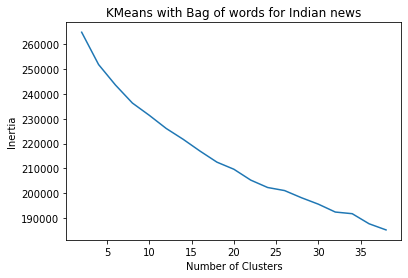

In [33]:
import matplotlib.pyplot as plt

plt.plot(n,inertia)
plt.title("KMeans with Bag of words for Indian news")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")



Text(0, 0.5, 'Inertia')

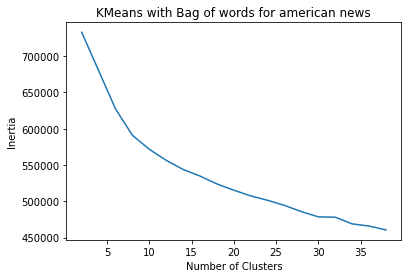

In [34]:
plt.plot(n,inertia1)
plt.title("KMeans with Bag of words for american news")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

In [35]:
clusterer = KMeans(8) 
    
cluster_labels = clusterer.fit_predict(bow_vectors)#bag of vectors predicted label for Indian data

In [36]:
clusterer1 = KMeans(8)

cluster1_labels = clusterer1.fit_predict(bow1)#bag of vectors predicted label for American data

In [37]:
df["labels"] = cluster_labels

idx_to_word = {values:key for key,values in count.vocabulary_.items()}#reversing the key value pair of words and vector

vocab_idx = np.argsort(clusterer.cluster_centers_, axis=1)[:,::-1][:,:10]#sorting the most important words

#Printing top 10 words of clusters
for i in range(8):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  1  talks about :

ice
sea
temperature
arctic
ocean
year
level
rise
warming
scientist
Cluster  2  talks about :

year
world
also
one
people
state
government
global
country
environment
Cluster  3  talks about :

country
emission
global
energy
world
carbon
also
year
paris
agreement
Cluster  4  talks about :

forest
land
work
tree
department
also
project
agency
construction
ministry
Cluster  5  talks about :

emission
would
energy
electricity
year
target
coal
cost
world
economic
Cluster  6  talks about :

extreme
event
district
risk
drought
analysis
impact
vulnerability
flood
vulnerable
Cluster  7  talks about :

country
emission
developed
pre
period
target
reduction
commitment
amendment
also
Cluster  8  talks about :

year
temperature
report
also
study
global
people
degree
level
world


In [38]:
cluster1_labels.shape

(915,)

In [39]:

f["labels"] = cluster1_labels #bag of vectors predicted label for American data data
idx_to_word = {values:key for key,values in count1.vocabulary_.items()}#reversing the key value pair of words and vector

vocab_idx = np.argsort(clusterer1.cluster_centers_, axis=1)[:,::-1][:,:10]#sorting the most important words

#Printing top 10 words of clusters
for i in range(8):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  1  talks about :

year
water
heat
people
city
temperature
state
say
also
one
Cluster  2  talks about :

que
los
la
para
una
por
del
con
dijo
como
Cluster  3  talks about :

park
new
city
east
river
public
would
plan
community
people
Cluster  4  talks about :

cattle
leather
supplier
amazon
brazil
supply
deforestation
company
farm
data
Cluster  5  talks about :

country
emission
world
global
year
coal
china
nation
would
cop
Cluster  6  talks about :

carbon
government
emission
energy
say
year
gas
new
zero
would
Cluster  7  talks about :

year
people
world
cop
would
government
emission
also
country
carbon
Cluster  8  talks about :

que
los
la
por
del
para
una
dijo
sus
con


<ipython-input-39-6bd9ec488f5d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster1_labels


## Kmeans with TFIDF Vectors

In [ ]:
from sklearn.cluster import KMeans
n = list(range(2,40,2))
inertia = []
inertia1 = []
for i in n:
    
    clusterer = KMeans(i)
    clusterer1 = KMeans(i)
    clusterer.fit(tf_idf_vectors)
    clusterer1.fit(tf_idf1)
    inertia.append(clusterer.inertia_)
    inertia1.append(clusterer1.inertia_)

Text(0, 0.5, 'Inertia')

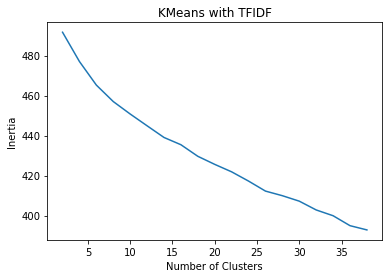

In [41]:
import matplotlib.pyplot as plt

plt.plot(n,inertia)
plt.title("KMeans with TFIDF")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

Text(0, 0.5, 'Inertia')

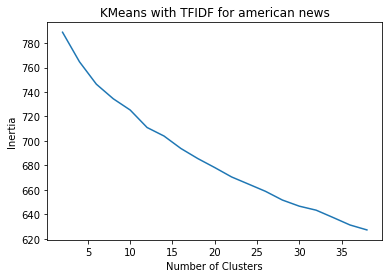

In [42]:
import matplotlib.pyplot as plt

plt.plot(n,inertia1)
plt.title("KMeans with TFIDF for american news")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

In [43]:
clusterer = KMeans(9)
    
cluster_labels = clusterer.fit_predict(tf_idf_vectors)

clusterer1 = KMeans(6)

cluster1_labels = clusterer1.fit_predict(tf_idf1)

In [44]:
df["labels"] = cluster_labels
f["labels"] = cluster1_labels

<ipython-input-44-60c85de59d05>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster1_labels


In [45]:
df.head()

,text,labels
1,cop wrap young influencers across world sharin...,4
2,despite recent headline grabbing promise prote...,2
3,leader conference party cop glasgow intended s...,8
4,british prime minister boris johnson praised i...,8
5,glasgow pact message investor executive march ...,8


In [46]:
f.head()

,text,labels
0,world set add nearly gigawatts renewable power...,4
1,bangor maine university maine researcher tryin...,2
2,article part fifth crime series ecocide publis...,2
3,london day arriving glasgow scotland billed pi...,5
4,early november los angeles city council member...,2


In [47]:
idx_to_word = {values:key for key,values in vectorizer.vocabulary_.items()}

In [48]:
vocab_idx = np.argsort(clusterer.cluster_centers_, axis=1)[:,::-1][:,:10]

In [49]:
for i in range(9):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  1  talks about :

rainfall
rain
extreme
cyclone
weather
monsoon
temperature
region
heat
people
Cluster  2  talks about :

biden
trump
president
presidential
accord
donald
paris
joe
democratic
administration
Cluster  3  talks about :

country
world
energy
government
economic
emission
global
year
report
new
Cluster  4  talks about :

temperature
report
degree
warming
rise
global
level
emission
wmo
record
Cluster  5  talks about :

people
specie
one
world
food
water
woman
say
child
environment
Cluster  6  talks about :

forest
project
ministry
area
state
environment
delhi
wetland
pollution
notification
Cluster  7  talks about :

thunberg
greta
school
student
activist
protest
strike
year
swedish
child
Cluster  8  talks about :

ice
sea
scientist
arctic
glacier
study
year
antarctica
temperature
sheet
Cluster  9  talks about :

country
emission
cop
energy
target
paris
summit
carbon
minister
modi


In [50]:
idx_to_word = {values:key for key,values in vectorizer1.vocabulary_.items()}
vocab_idx = np.argsort(clusterer1.cluster_centers_, axis=1)[:,::-1][:,:10]

In [51]:
for i in range(6):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  1  talks about :

que
water
los
la
para
drought
lake
river
una
por
Cluster  2  talks about :

police
protest
protester
insulate
britain
activist
officer
group
road
people
Cluster  3  talks about :

heat
fire
temperature
year
water
flood
weather
extreme
ice
study
Cluster  4  talks about :

people
cop
world
glasgow
summit
leader
young
conference
activist
say
Cluster  5  talks about :

carbon
energy
emission
government
gas
zero
would
net
oil
say
Cluster  6  talks about :

country
coal
emission
china
cop
world
nation
global
agreement
summit


## Kmeans with Word Vectors

Text(0, 0.5, 'Inertia')

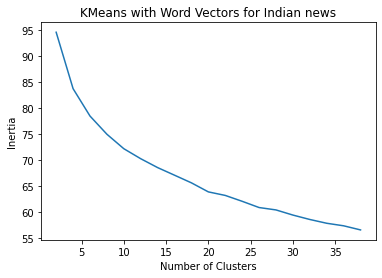

In [52]:
from sklearn.cluster import KMeans
n = list(range(2,40,2))
inertia = []
inertia1 = []
for i in n:
    
    clusterer = KMeans(i)
    clusterer1 = KMeans(i)
    clusterer.fit(word_vectors)
    clusterer1.fit(word_vectors1)
    inertia.append(clusterer.inertia_)
    inertia1.append(clusterer1.inertia_)

plt.plot(n,inertia)
plt.title("KMeans with Word Vectors for Indian news")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

Text(0, 0.5, 'Inertia')

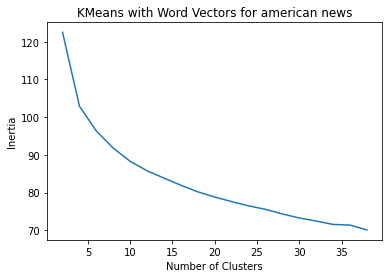

In [53]:
plt.plot(n,inertia1)
plt.title("KMeans with Word Vectors for american news")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

In [54]:
clusterer = KMeans(4)
    
cluster_labels = clusterer.fit_predict(word_vectors)

clusterer1 = KMeans(4)

cluster1_labels = clusterer1.fit_predict(word_vectors1)

In [55]:
df["labels"] = cluster_labels
f["labels"] = cluster1_labels

<ipython-input-55-60c85de59d05>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster1_labels


In [56]:
df.head()

,text,labels
1,cop wrap young influencers across world sharin...,2
2,despite recent headline grabbing promise prote...,0
3,leader conference party cop glasgow intended s...,2
4,british prime minister boris johnson praised i...,2
5,glasgow pact message investor executive march ...,0


In [57]:
f.head()

,text,labels
0,world set add nearly gigawatts renewable power...,1
1,bangor maine university maine researcher tryin...,0
2,article part fifth crime series ecocide publis...,0
3,london day arriving glasgow scotland billed pi...,3
4,early november los angeles city council member...,0


In [58]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
stopwords.update(["country", "year", "state", "world", "time","one","area","people","que","los","la","para","una",
"por","del","con","dijo","como"])

Cluster  1  talks about :



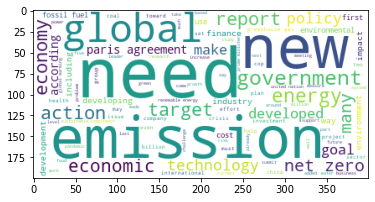

Cluster  2  talks about :



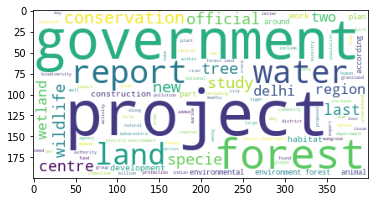

Cluster  3  talks about :



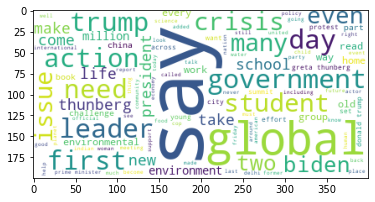

Cluster  4  talks about :



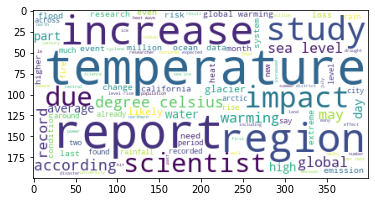

In [59]:
for i in range(4):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

Cluster  1  talks about :



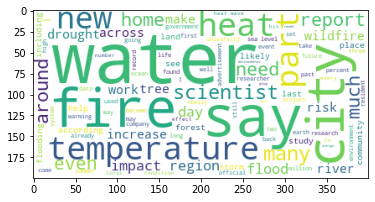

Cluster  2  talks about :



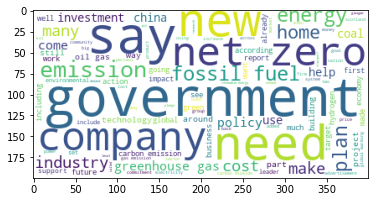

Cluster  3  talks about :



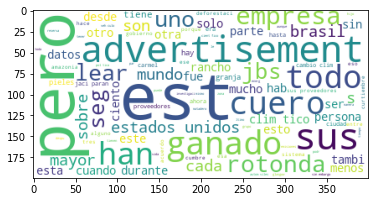

Cluster  4  talks about :



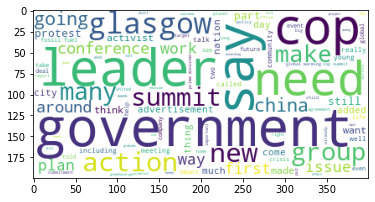

In [60]:
for i in range(4):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(f[f["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

## GaussianMixture

## GaussianMixture with Bag of Words

In [61]:
from sklearn.mixture import GaussianMixture
from sklearn import mixture
# We use a small scope of grid search to find the best parameters of GMM

lowest_bic = np.infty   # initial BIC is set to infinity
best_gmm = None
lowest_bic1 = np.infty   # initial BIC is set to infinity
best_gmm1 = None
n_components_range = range(2,10)    # The number of clusters

cv_types = ['spherical', 'tied', 'diag']  # The covariance type

for cv_type in cv_types:
    
    for n_components in n_components_range:
        
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm1 = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm.fit(bow_vectors.toarray())
        gmm1.fit(bow1.toarray())
        bic = gmm.bic(bow_vectors.toarray())  # get Model BIC
        bic1 = gmm1.bic(bow1.toarray())
        if bic < lowest_bic:  # save the model with lowest BIC sofar
            lowest_bic = bic
            best_gmm = gmm
        if bic1 < lowest_bic1:
            lowest_bic1 = bic1
            best_gmm1 = gmm1

In [62]:
lowest_bic
best_gmm

GaussianMixture(covariance_type='diag', n_components=9, random_state=42)

In [63]:
lowest_bic1
best_gmm1

GaussianMixture(covariance_type='diag', n_components=7, random_state=42)

In [65]:
clusterer = GaussianMixture(9)
    
cluster_labels = clusterer.fit_predict(bow_vectors.toarray())

clusterer1 = GaussianMixture(7)

cluster1_labels = clusterer1.fit_predict(bow1.toarray())

In [66]:
clusterer.weights_.argsort()[::-1][:5]

array([7, 4, 8, 2, 5])

In [67]:
clusterer1.weights_.argsort()[::-1][:5]

array([5, 1, 0, 3, 4])

In [68]:
df["labels"] = cluster_labels

idx_to_word = {values:key for key,values in count.vocabulary_.items()}

vocab_idx = np.argsort(clusterer.means_, axis=1)[:,::-1][:,:10]


#picking  5 important clusters based on weights
for i in clusterer.weights_.argsort()[::-1][:5]:
    print("="*50)
    print("Cluster ",i," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  7  talks about :

year
state
also
area
study
people
forest
government
global
one
Cluster  4  talks about :

world
year
country
also
people
one
global
need
time
energy
Cluster  8  talks about :

temperature
year
sea
degree
level
report
extreme
global
ice
warming
Cluster  2  talks about :

country
emission
energy
global
world
carbon
also
target
year
paris
Cluster  5  talks about :

forest
project
area
land
draft
state
crz
public
notification
environment


In [69]:
f["labels"] = cluster1_labels

idx_to_word = {values:key for key,values in count1.vocabulary_.items()}

vocab_idx = np.argsort(clusterer1.means_, axis=1)[:,::-1][:,:10]


#picking  5 important clusters based on weights
for i in clusterer1.weights_.argsort()[::-1][:5]:
    print("="*50)
    print("Cluster ",i," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  5  talks about :

year
people
world
would
also
cop
government
country
one
emission
Cluster  1  talks about :

emission
say
year
carbon
country
government
world
energy
gas
new
Cluster  0  talks about :

would
new
year
state
community
people
one
time
company
also
Cluster  3  talks about :

country
china
emission
world
state
global
united
one
nation
year
Cluster  4  talks about :

que
los
la
para
una
por
del
con
dijo
como


<ipython-input-69-dd3988f6b89c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster1_labels


### GaussianMixture with TFIDF

In [70]:
from sklearn.mixture import GaussianMixture
from sklearn import mixture
# We use a small scope of grid search to find the best parameters of GMM

lowest_bic = np.infty   # initial BIC is set to infinity
best_gmm = None
lowest_bic1 = np.infty   # initial BIC is set to infinity
best_gmm1 = None
n_components_range = range(2,10)    # The number of clusters

cv_types = ['spherical', 'tied', 'diag']  # The covariance type

for cv_type in cv_types:
    
    for n_components in n_components_range:
        
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm1 = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm.fit(tf_idf_vectors.toarray())
        gmm1.fit(tf_idf1.toarray())
        bic = gmm.bic(tf_idf_vectors.toarray())  # get Model BIC
        bic1 = gmm1.bic(tf_idf1.toarray())
        if bic < lowest_bic:  # save the model with lowest BIC sofar
            lowest_bic = bic
            best_gmm = gmm
        if bic1 < lowest_bic1:
            lowest_bic1 = bic1
            best_gmm1 = gmm1

In [71]:
lowest_bic
best_gmm

GaussianMixture(covariance_type='diag', n_components=9, random_state=42)

In [72]:
lowest_bic1
best_gmm1

GaussianMixture(covariance_type='diag', n_components=9, random_state=42)

In [73]:
clusterer = GaussianMixture(9)
    
cluster_labels = clusterer.fit_predict(tf_idf_vectors.toarray())

clusterer1 = GaussianMixture(9)

cluster1_labels = clusterer1.fit_predict(tf_idf1.toarray())

In [74]:
df["labels"] = cluster_labels

idx_to_word = {values:key for key,values in vectorizer.vocabulary_.items()}

vocab_idx = np.argsort(clusterer.means_, axis=1)[:,::-1][:,:10]

for i in clusterer.weights_.argsort():
    print("="*50)
    print("Cluster ",i," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  4  talks about :

mumbai
coastal
draft
notification
eia
area
project
wetland
crz
zone
Cluster  6  talks about :

biden
trump
president
presidential
donald
accord
democratic
administration
paris
joe
Cluster  3  talks about :

ice
glacier
sea
arctic
antarctica
snow
region
sheet
study
level
Cluster  0  talks about :

thunberg
greta
school
student
activist
protest
strike
year
swedish
child
Cluster  8  talks about :

forest
specie
state
project
ministry
department
pollution
area
conservation
government
Cluster  7  talks about :

emission
energy
carbon
country
zero
net
target
renewable
world
solar
Cluster  5  talks about :

temperature
degree
heat
report
record
warming
year
global
celsius
rise
Cluster  1  talks about :

country
minister
modi
cop
nation
world
global
paris
summit
agreement
Cluster  2  talks about :

people
world
water
year
one
say
food
health
time
event


In [75]:
f["labels"] = cluster1_labels

idx_to_word = {values:key for key,values in count1.vocabulary_.items()}

vocab_idx = np.argsort(clusterer1.means_, axis=1)[:,::-1][:,:10]


#picking  5 important clusters based on weights
for i in clusterer1.weights_.argsort()[::-1][:5]:
    print("="*50)
    print("Cluster ",i," talks about :")
    print()
    
    a = [print(idx_to_word[x]) for x in vocab_idx[i]]

Cluster  2  talks about :

energy
emission
carbon
government
company
oil
zero
gas
would
net
Cluster  1  talks about :

water
temperature
year
heat
ice
flood
people
extreme
report
weather
Cluster  3  talks about :

country
emission
coal
china
global
agreement
nation
world
fossil
fuel
Cluster  0  talks about :

people
school
say
young
cop
plastic
food
world
year
carbon
Cluster  6  talks about :

cop
summit
leader
glasgow
world
country
conference
johnson
president
minister


<ipython-input-75-dd3988f6b89c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster1_labels


## GaussianMixture with Word Vectors

In [76]:
from sklearn.mixture import GaussianMixture
from sklearn import mixture
# We use a small scope of grid search to find the best parameters of GMM

lowest_bic = np.infty   # initial BIC is set to infinity
best_gmm = None
lowest_bic1 = np.infty   # initial BIC is set to infinity
best_gmm1 = None
n_components_range = range(2,10)    # The number of clusters

cv_types = ['spherical', 'tied', 'diag']  # The covariance type

for cv_type in cv_types:
    
    for n_components in n_components_range:
        
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm1 = mixture.GaussianMixture(n_components=n_components,
                    covariance_type=cv_type, random_state=42)
        gmm.fit(word_vectors)
        gmm1.fit(word_vectors1)
        bic = gmm.bic(word_vectors)  # get Model BIC
        bic1 = gmm1.bic(word_vectors1)
        if bic < lowest_bic:  # save the model with lowest BIC sofar
            lowest_bic = bic
            best_gmm = gmm
        if bic1 < lowest_bic1:
            lowest_bic1 = bic1
            best_gmm1 = gmm1

In [77]:
lowest_bic
best_gmm

GaussianMixture(covariance_type='spherical', n_components=9, random_state=42)

In [78]:
lowest_bic1
best_gmm1

GaussianMixture(covariance_type='tied', n_components=4, random_state=42)

In [79]:
clusterer = GaussianMixture(9)
    
cluster_labels = clusterer.fit_predict(word_vectors)

clusterer1 = GaussianMixture(4)

cluster1_labels = clusterer1.fit_predict(word_vectors1)

Cluster  6  talks about :



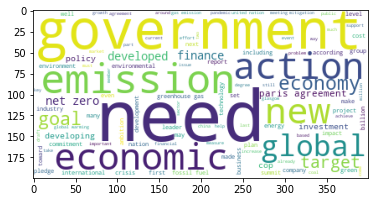

Cluster  4  talks about :



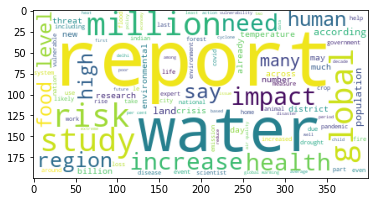

Cluster  9  talks about :



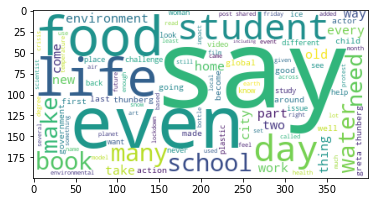

Cluster  8  talks about :



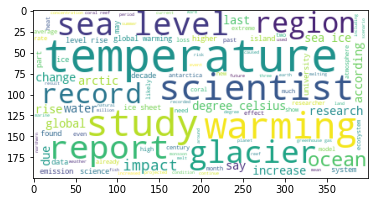

Cluster  3  talks about :



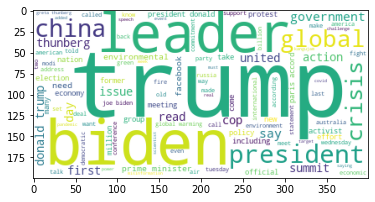

In [80]:
clusterer = GaussianMixture(9)
    
cluster_labels = clusterer.fit_predict(word_vectors)

df["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in clusterer.weights_.argsort()[::-1][:5]:
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

<ipython-input-81-6fdcdd16d62d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



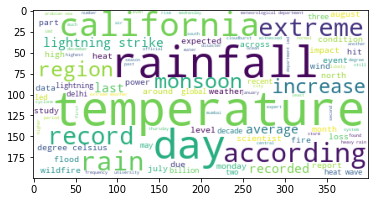

Cluster  3  talks about :



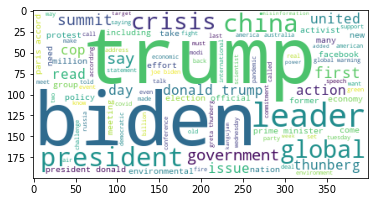

Cluster  4  talks about :



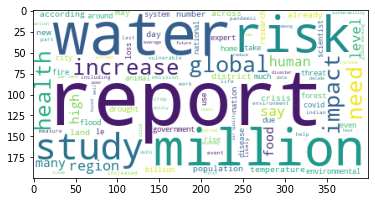

Cluster  2  talks about :



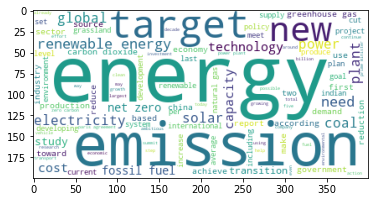

In [81]:
clusterer = GaussianMixture(4)
    
cluster_labels = clusterer.fit_predict(word_vectors1)

f["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in clusterer.weights_.argsort()[::-1][:5]:
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

## Agglomerative Clustering

### Agglomerative Clustering with Bag of words

This is for Indian news


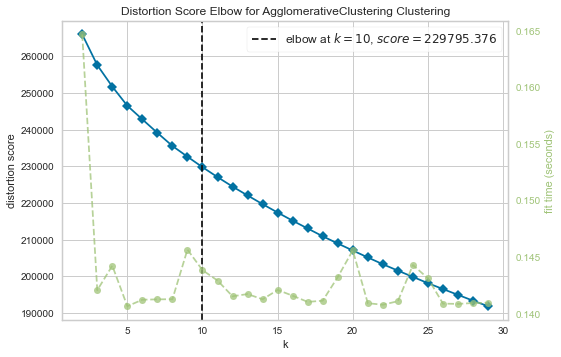

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [84]:
# Elbow Method for Heirarchical Clustering

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for Indian news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(bow_vectors.toarray())        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

Cluster  1  talks about :



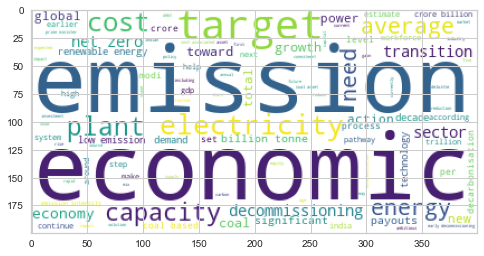

Cluster  2  talks about :



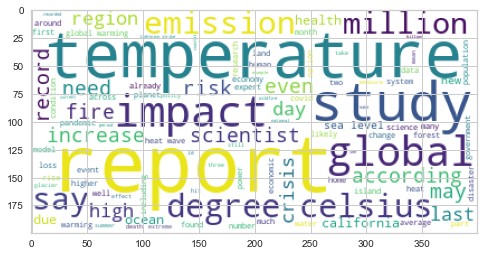

Cluster  3  talks about :



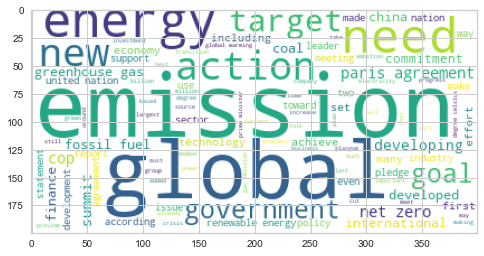

Cluster  4  talks about :



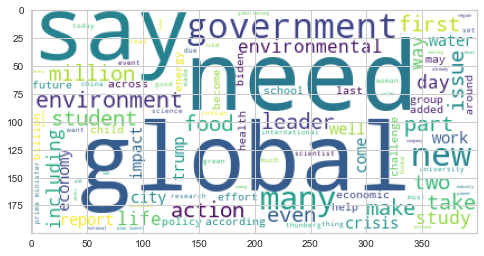

Cluster  5  talks about :



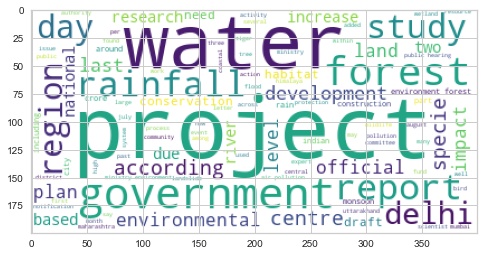

Cluster  6  talks about :



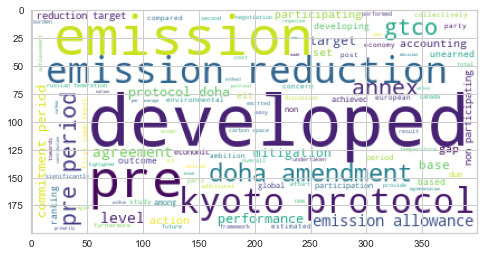

Cluster  7  talks about :



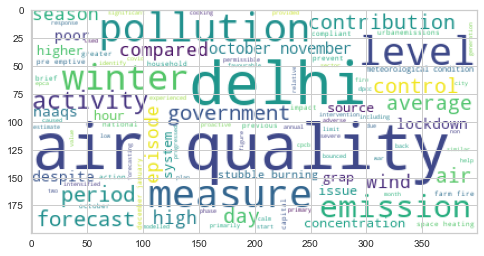

Cluster  8  talks about :



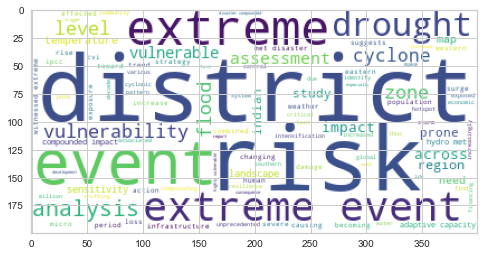

Cluster  9  talks about :



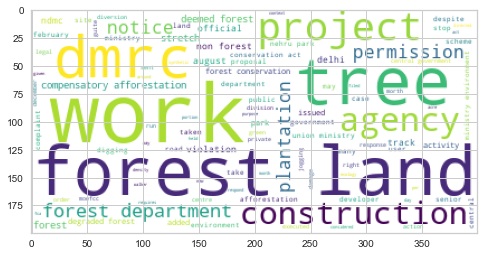

Cluster  10  talks about :



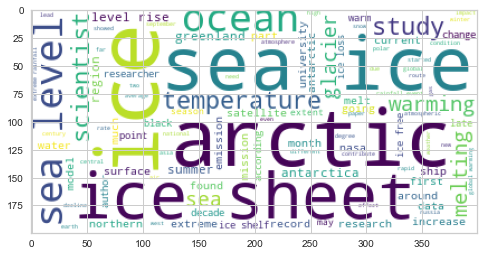

In [89]:

from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(10)
    
cluster_labels = clusterer.fit_predict(bow_vectors.toarray())

df["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(10):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

This is for American news


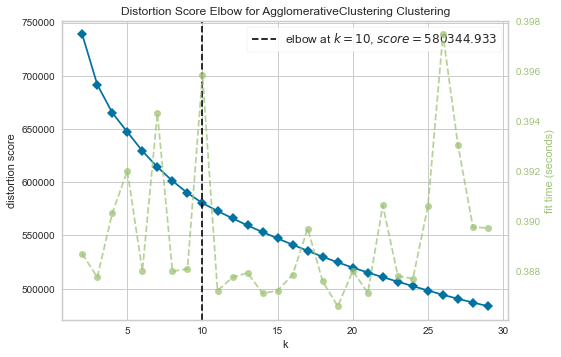

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [86]:
# Elbow Method for Heirarchical Clustering

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for American news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(bow1.toarray())        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

<ipython-input-88-10a7412d7c62>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



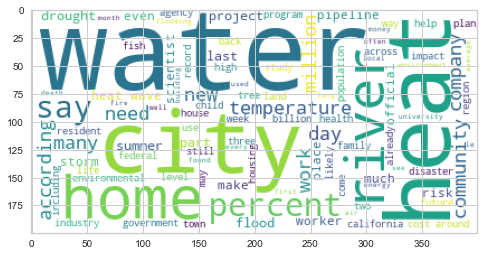

Cluster  2  talks about :



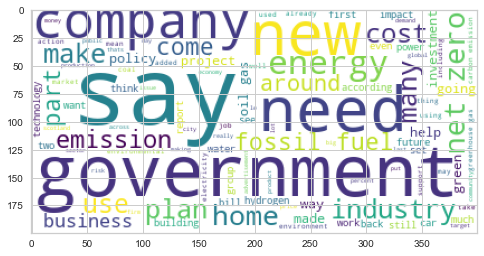

Cluster  3  talks about :



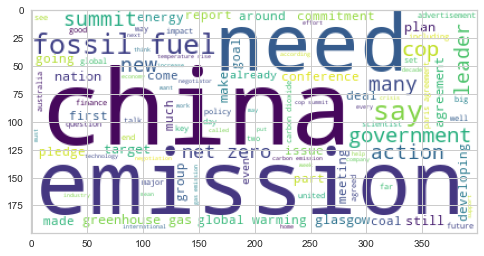

Cluster  4  talks about :



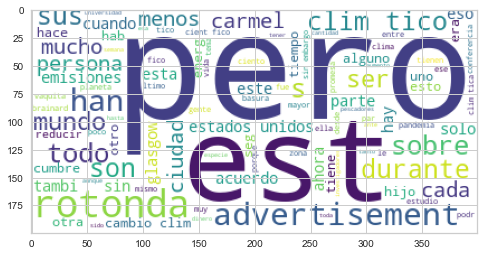

Cluster  5  talks about :



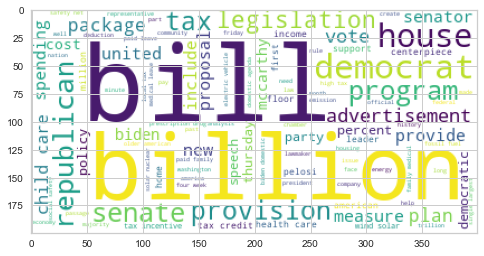

Cluster  6  talks about :



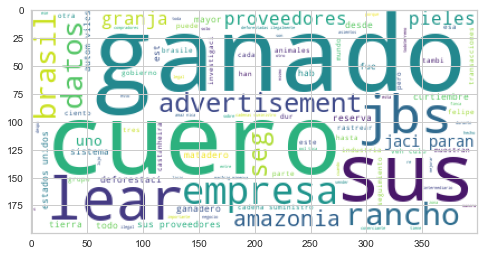

Cluster  7  talks about :



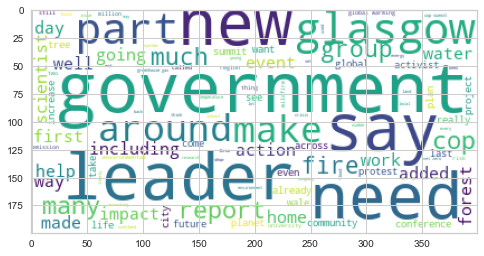

Cluster  8  talks about :



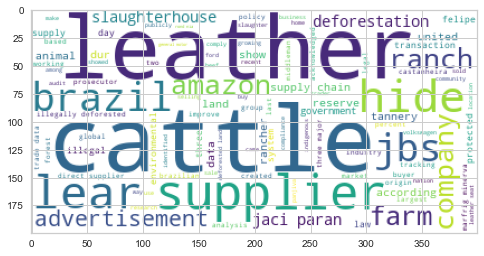

Cluster  9  talks about :



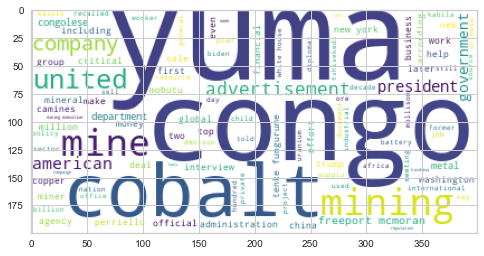

Cluster  10  talks about :



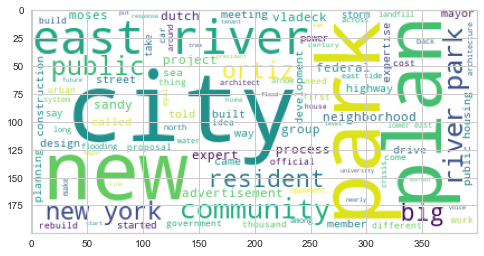

In [88]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(10)
    
cluster_labels = clusterer.fit_predict(bow1.toarray())

f["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(10):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(f[f["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

# AGGLOMERATIVE CLUSTERING

This is for Indian news


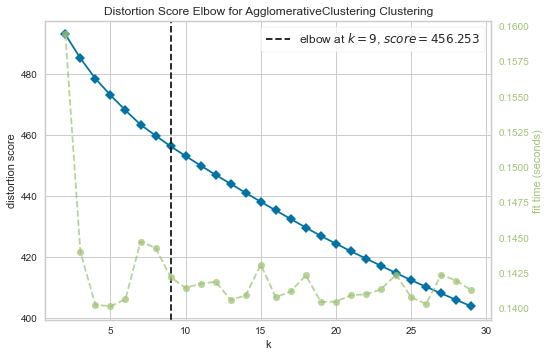

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [90]:
# Elbow Method for Heirarchical Clustering

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for Indian news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(tf_idf_vectors.toarray())        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

Cluster  1  talks about :



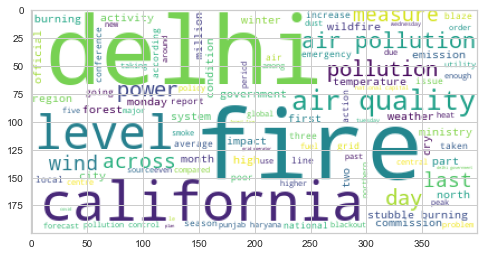

Cluster  2  talks about :



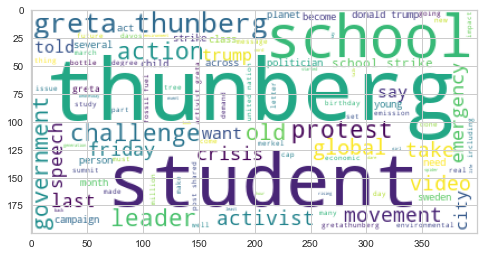

Cluster  3  talks about :



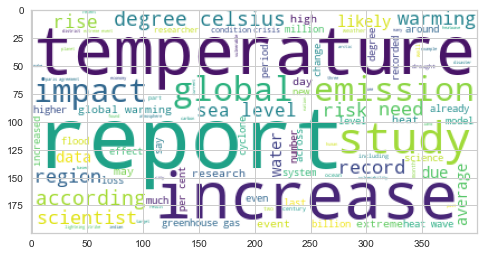

Cluster  4  talks about :



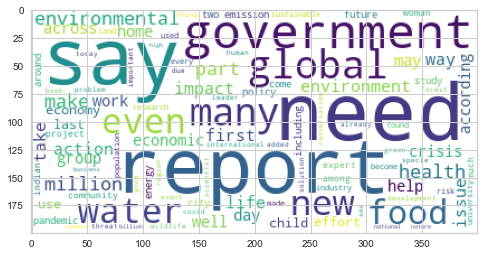

Cluster  5  talks about :



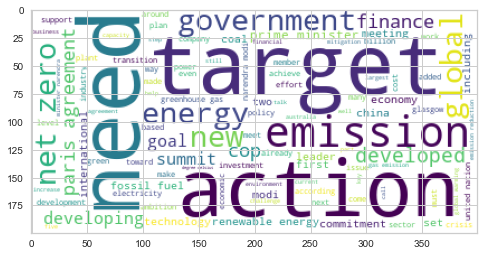

Cluster  6  talks about :



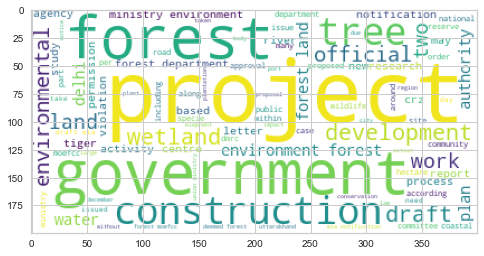

Cluster  7  talks about :



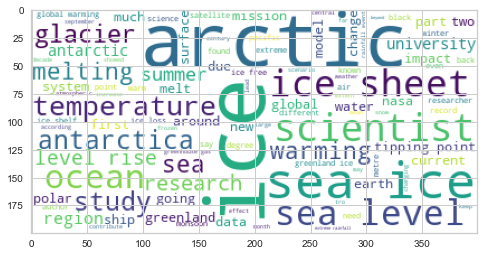

Cluster  8  talks about :



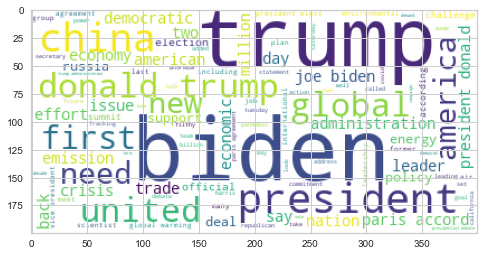

Cluster  9  talks about :



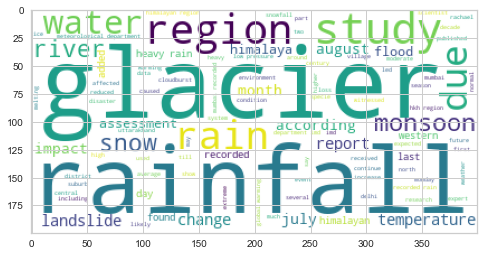

In [91]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(9)
    
cluster_labels = clusterer.fit_predict(tf_idf_vectors.toarray())

df["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(9):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

This is for American news


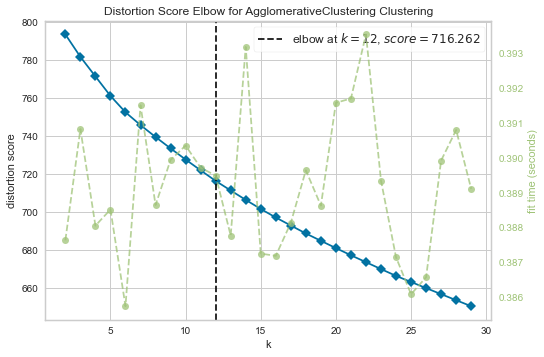

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [93]:
# Elbow Method for Heirarchical Clustering

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for American news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(tf_idf1.toarray())        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

<ipython-input-106-9557247e3f93>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



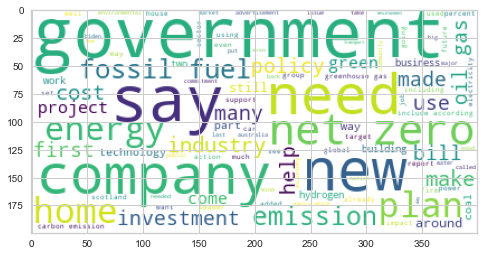

Cluster  2  talks about :



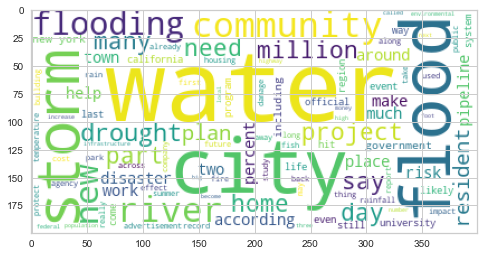

Cluster  3  talks about :



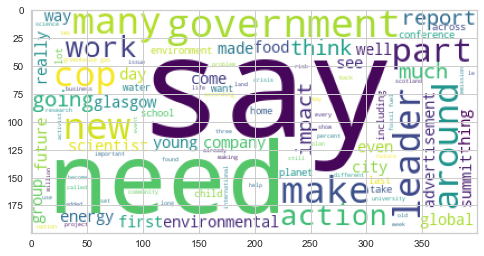

Cluster  4  talks about :



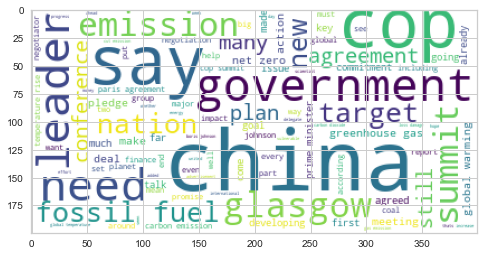

Cluster  5  talks about :



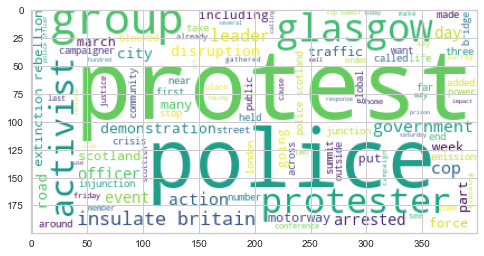

Cluster  6  talks about :



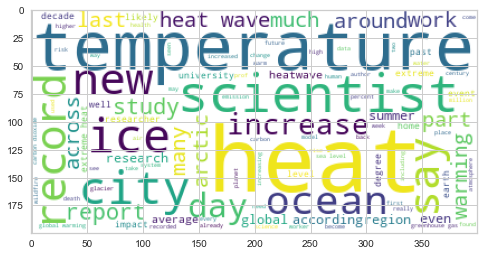

Cluster  7  talks about :



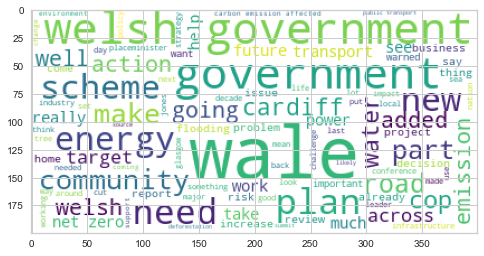

Cluster  8  talks about :



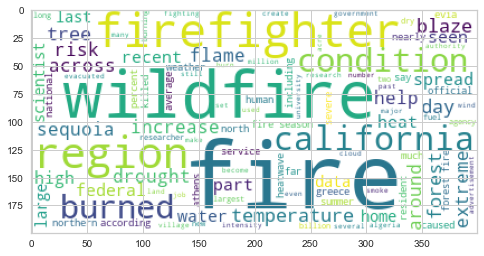

Cluster  9  talks about :



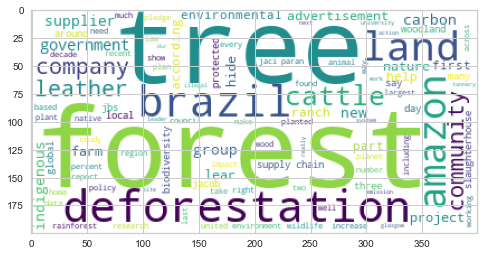

Cluster  10  talks about :



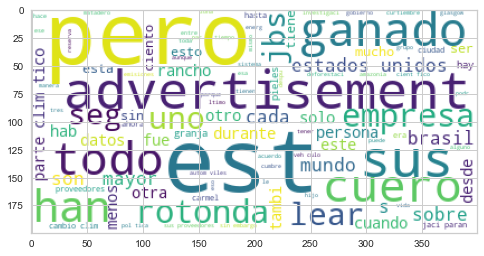

In [106]:
#We approximate the elbow at 10 as the visualiser does not give the perfect elbow always , it has to be decided by us
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(10)
    
cluster_labels = clusterer.fit_predict(tf_idf1.toarray())

f["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(10):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(f[f["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

### Agglomerative Clustering with Word Vectors

This is for Indian news


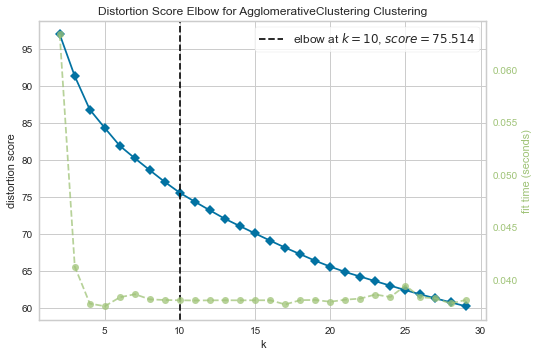

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [98]:
# Elbow Method for Heirarchical Clustering

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for Indian news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(word_vectors)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

Cluster  1  talks about :



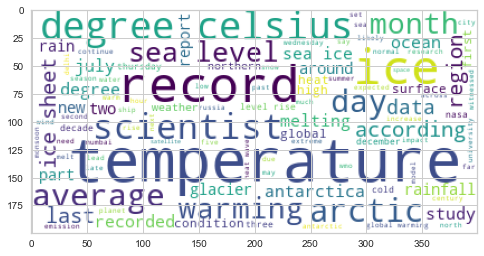

Cluster  2  talks about :



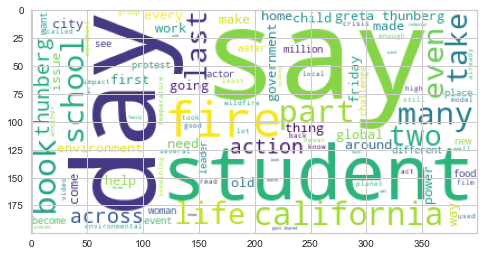

Cluster  3  talks about :



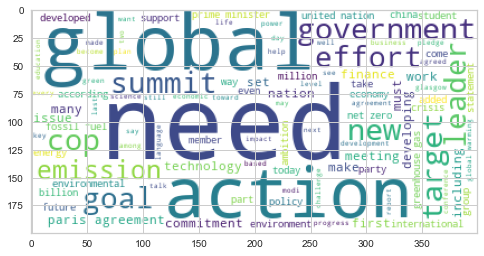

Cluster  4  talks about :



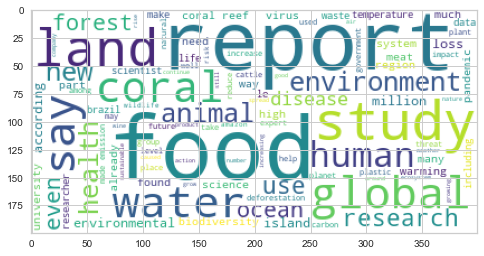

Cluster  5  talks about :



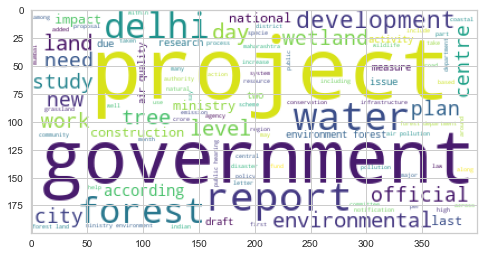

Cluster  6  talks about :



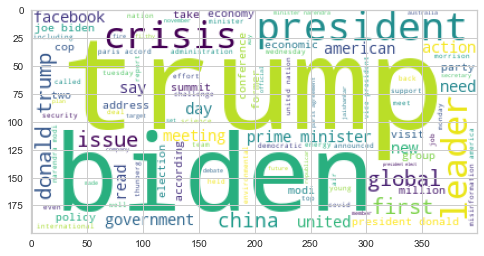

Cluster  7  talks about :



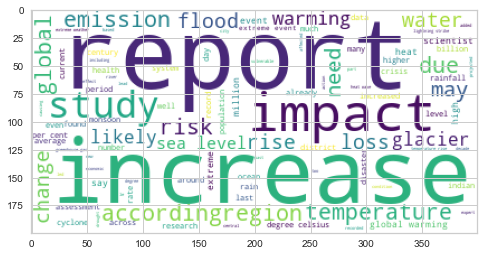

Cluster  8  talks about :



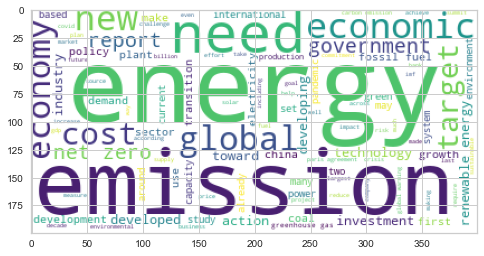

In [99]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(9)
    
cluster_labels = clusterer.fit_predict(word_vectors)

df["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(8):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

This is for American news


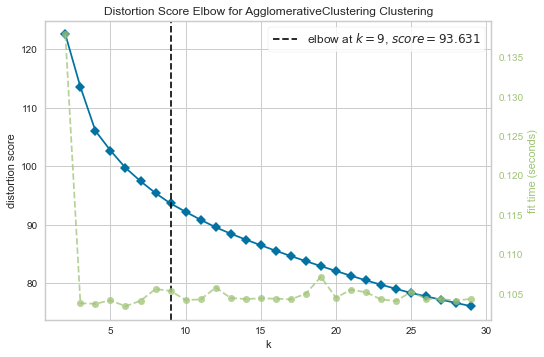

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [102]:

from sklearn.cluster import MiniBatchKMeans
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

# define dataset
# define the model

print("This is for American news")
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(word_vectors1)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

<ipython-input-104-3195e8b72e53>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



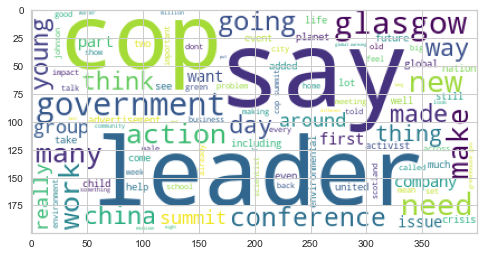

Cluster  2  talks about :



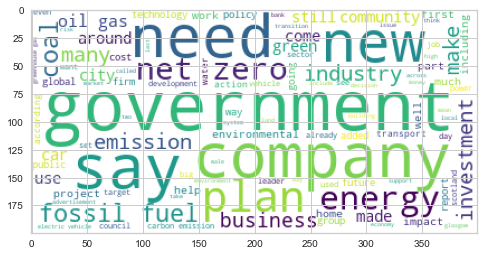

Cluster  3  talks about :



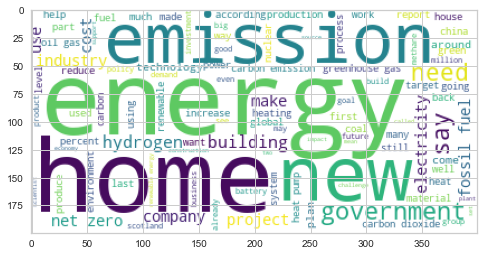

Cluster  4  talks about :



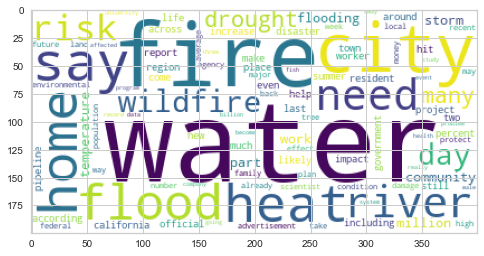

Cluster  5  talks about :



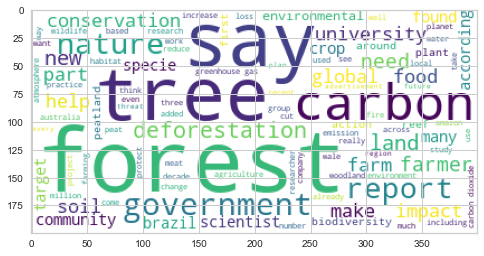

Cluster  6  talks about :



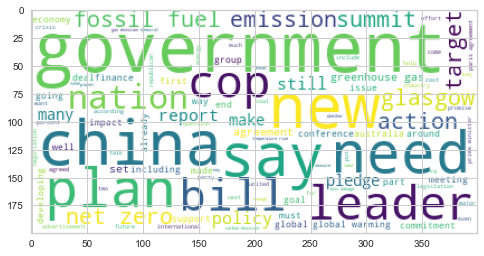

Cluster  7  talks about :



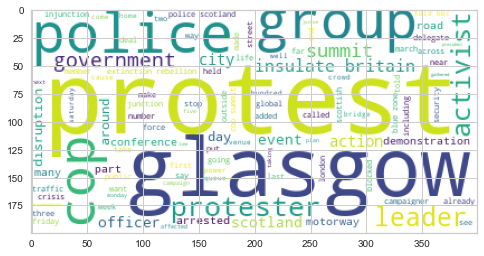

Cluster  8  talks about :



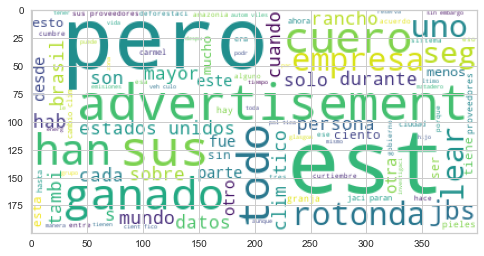

Cluster  9  talks about :



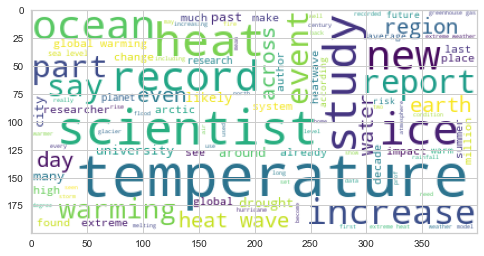

In [104]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(9)
    
cluster_labels = clusterer.fit_predict(word_vectors1)

f["labels"] = cluster_labels

#picking  5 important clusters based on weights
for i in range(9):
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(f[f["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

## DBSCAN

### DBSCAN with Bag of words

In [111]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
neighbors = NearestNeighbors(n_neighbors=550)#INDIAN
neighbors1 = NearestNeighbors(n_neighbors=550)#AMERICAN
neighbors_fit = neighbors.fit(bow_vectors)#INDIAN DATA FITTING
distances, indices = neighbors_fit.kneighbors(bow_vectors)#DISTANCES AND INDICES

In [112]:
neighbors1_fit = neighbors1.fit(bow1)#AMERICAN DATA FITTING
distances1, indices1 = neighbors_fit.kneighbors(bow1)#DISTANCES AND INDICES

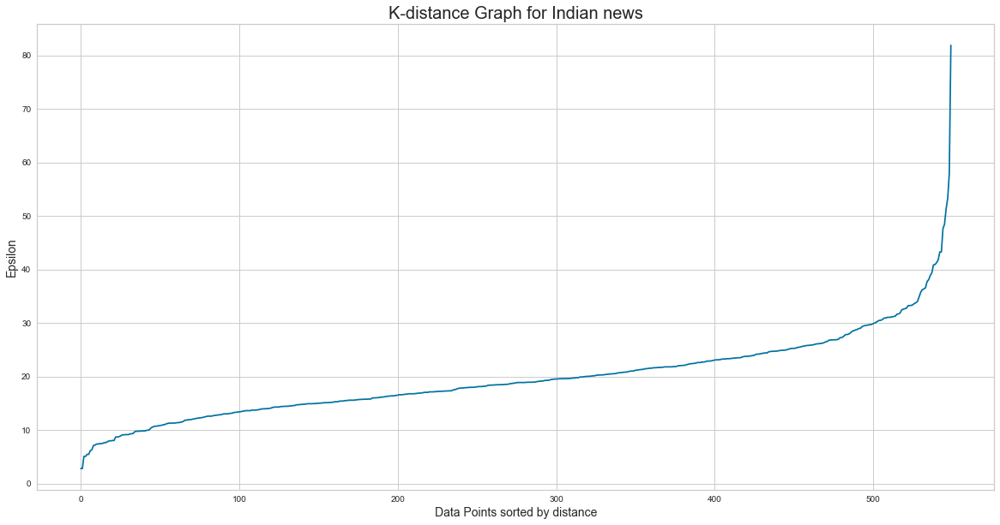

In [115]:
# Plotting K-distance Graph for indian news
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for Indian news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

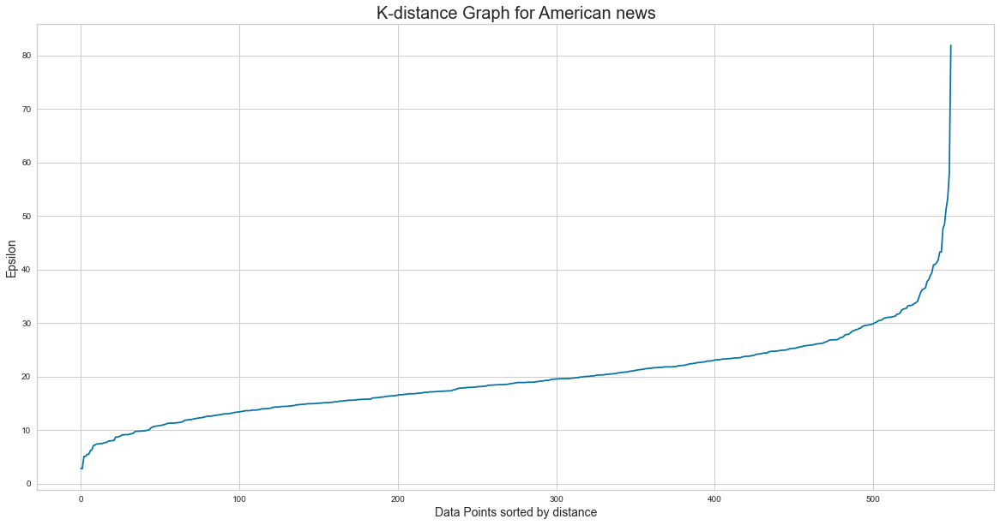

In [116]:
# Plotting K-distance Graph for American news
distances1 = np.sort(distances1, axis=0)
distances1 = distances1[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for American news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [ ]:
CLUSTERING FOR INDIAN NEWS

In [189]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(bow_vectors, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance

In [191]:
distance_array.shape

(550, 550)

In [196]:
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.36, min_samples=3,metric='precomputed')

Cluster  1  talks about :



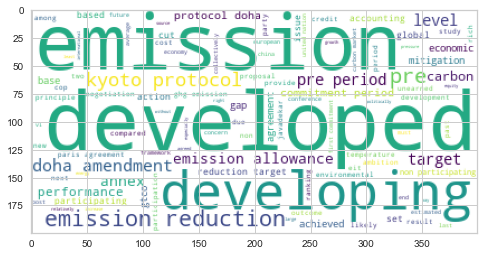

Cluster  2  talks about :



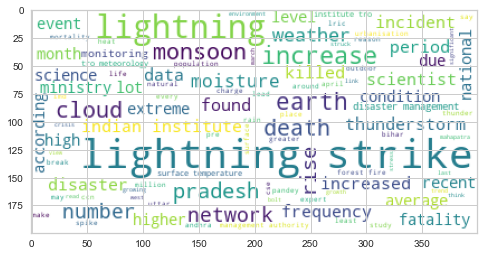

Cluster  3  talks about :



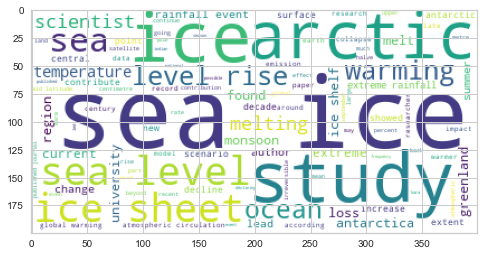

Cluster  4  talks about :



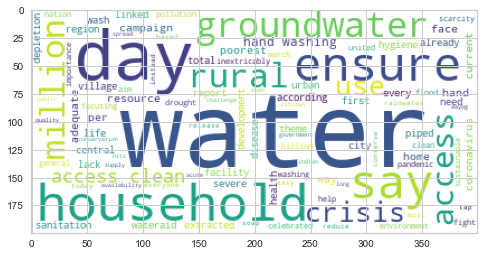

Cluster  5  talks about :



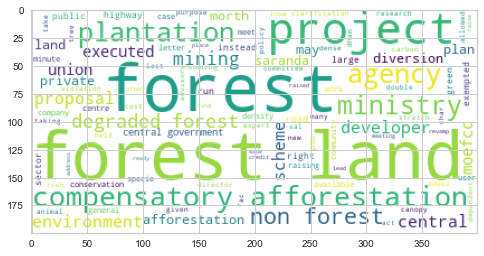

Cluster  6  talks about :



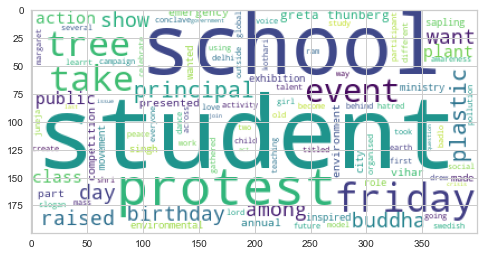

In [197]:
cluster_labels = clusterer.fit_predict(distance_array)
df["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1:
        continue
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

In [145]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(bow1, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.3, min_samples=3,metric='precomputed')

Cluster  1  talks about :



<ipython-input-146-94b1c4a5c4d6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


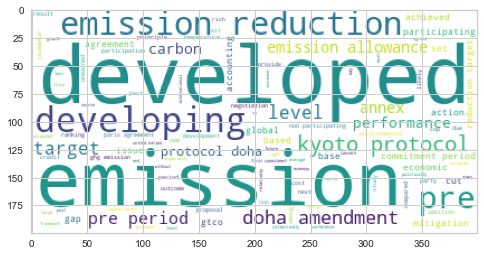

Cluster  2  talks about :



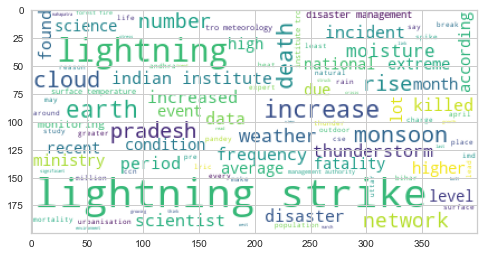

Cluster  3  talks about :



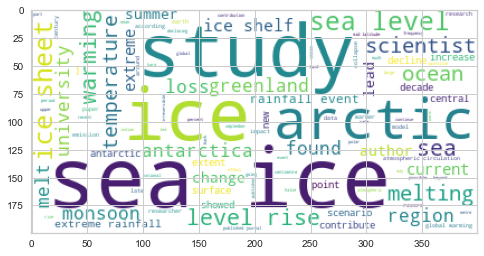

Cluster  4  talks about :



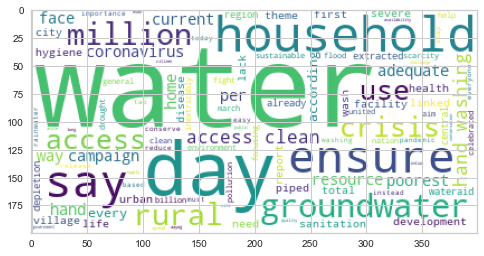

Cluster  5  talks about :



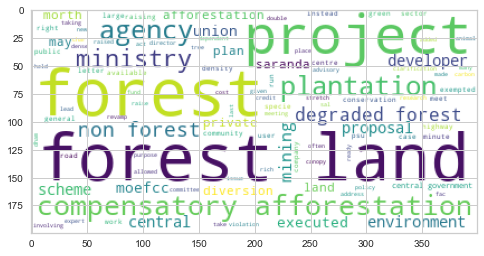

Cluster  6  talks about :



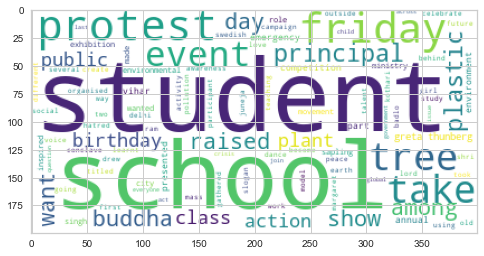

In [146]:
cluster_labels = clusterer.fit_predict(distance_array)
f["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1 :
        continue
    print("="*50)
    if i == 6:
        break
    print("Cluster ",i+1," talks about :")
    print()
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

### DBSCAN with TFIDF

In [306]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
neighbors = NearestNeighbors(n_neighbors=550)
neighbors1 = NearestNeighbors(n_neighbors=550)
neighbors_fit = neighbors.fit(tf_idf_vectors)
distances, indices = neighbors_fit.kneighbors(tf_idf_vectors)

In [307]:
neighbors1_fit = neighbors1.fit(tf_idf1)
distances1, indices1 = neighbors_fit.kneighbors(tf_idf1)

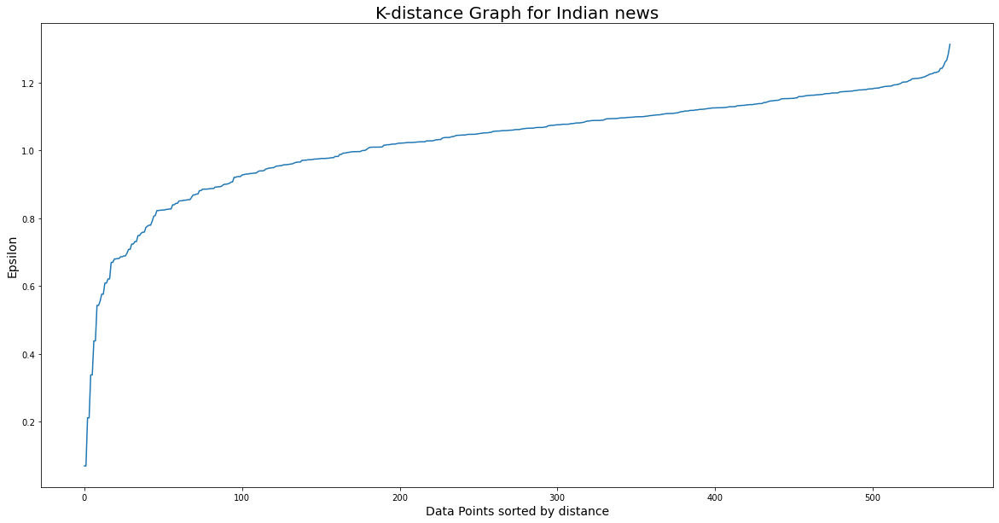

In [308]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for Indian news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

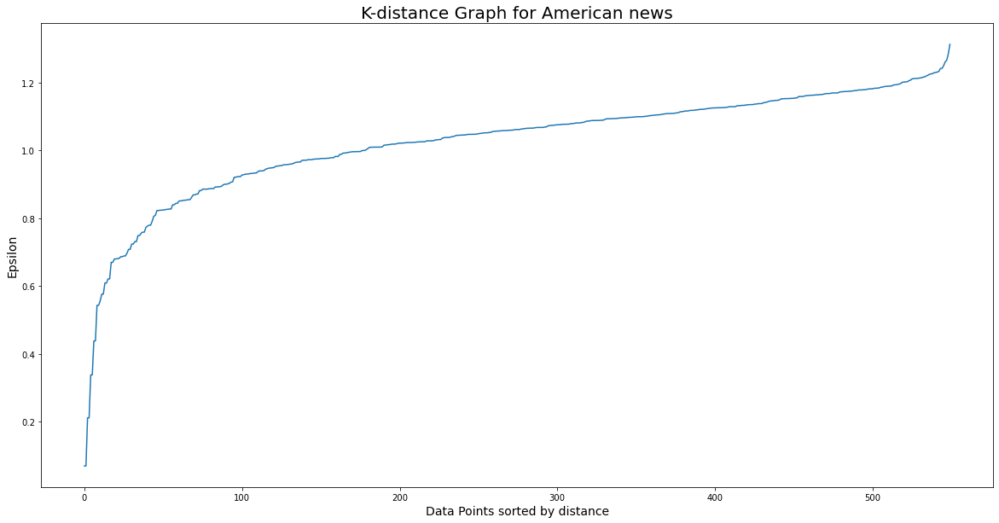

In [309]:
distances1 = np.sort(distances1, axis=0)
distances1 = distances1[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for American news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [314]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(tf_idf_vectors, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.7, min_samples=3,metric='precomputed')

Cluster  1  talks about :



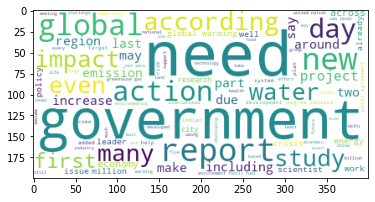

Cluster  2  talks about :



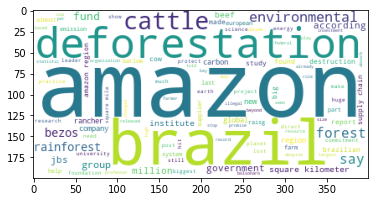

Cluster  3  talks about :



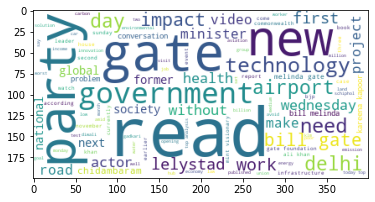

Cluster  4  talks about :



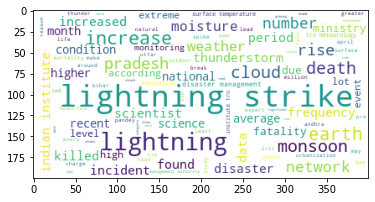

Cluster  5  talks about :



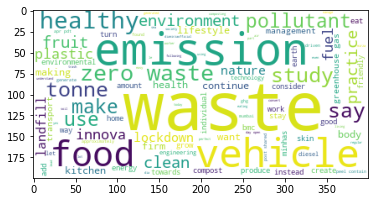

In [315]:
cluster_labels = clusterer.fit_predict(distance_array)
df["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1 :
        continue
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

In [322]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(tf_idf1, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.62, min_samples=3,metric='precomputed')

<ipython-input-323-e9ecc41bc620>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



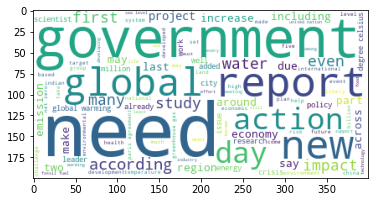

Cluster  2  talks about :



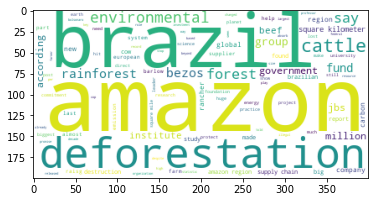

Cluster  3  talks about :



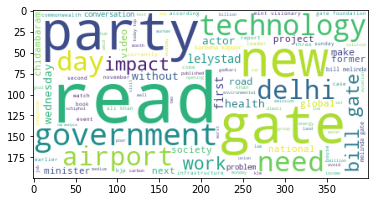

Cluster  4  talks about :



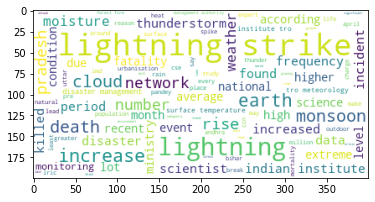

Cluster  5  talks about :



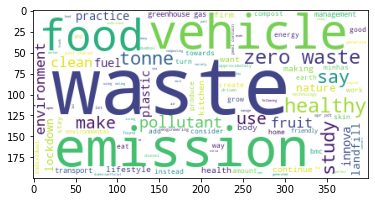

In [323]:
cluster_labels = clusterer.fit_predict(distance_array)
f["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1 :
        continue
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

# DBSCAN WITH WORD2VEC

In [147]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
neighbors = NearestNeighbors(n_neighbors=550)
neighbors1 = NearestNeighbors(n_neighbors=550)
neighbors_fit = neighbors.fit(word_vectors)
distances, indices = neighbors_fit.kneighbors(word_vectors)

In [148]:
neighbors1_fit = neighbors1.fit(word_vectors1)
distances1, indices1 = neighbors_fit.kneighbors(word_vectors1)

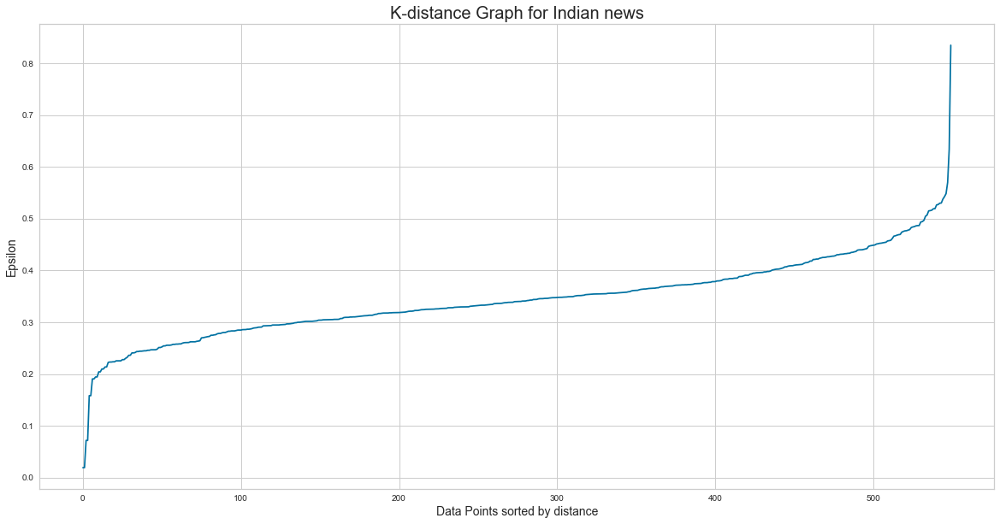

In [149]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for Indian news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

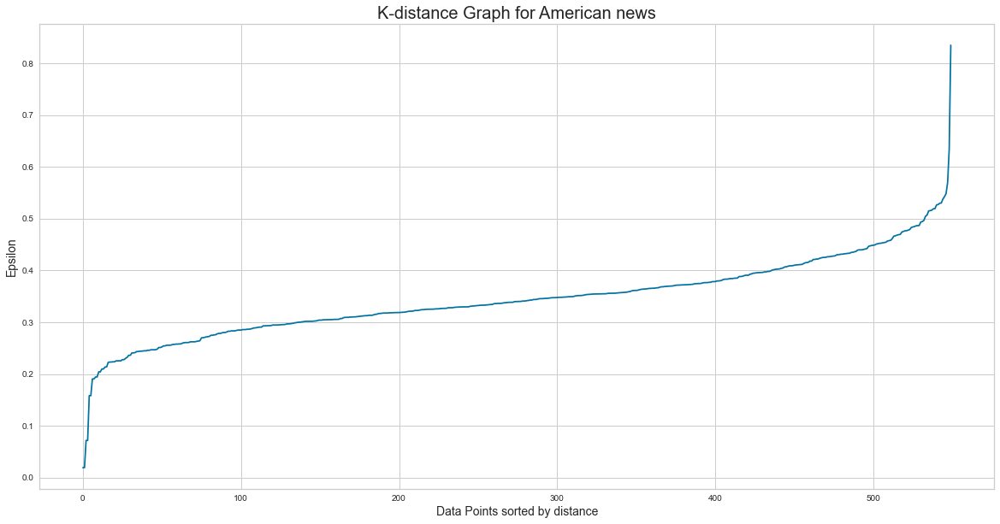

In [150]:
distances1 = np.sort(distances1, axis=0)
distances1 = distances1[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph for American news',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [182]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(word_vectors, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.47, min_samples=3,metric='precomputed')

Cluster  1  talks about :



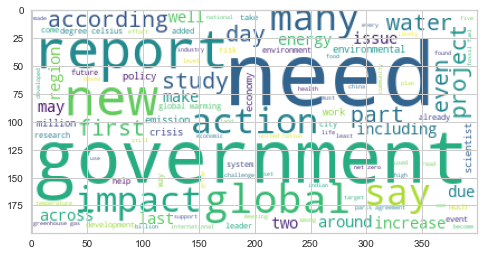

In [183]:
cluster_labels = clusterer.fit_predict(distance_array)
df["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1 :
        continue
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

In [187]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(word_vectors1, metric='cosine')
#To prevent any dimension problem and increase accuracy we use cosine instead of euclidean distance
from sklearn.cluster import DBSCAN
clusterer = DBSCAN(eps=0.5, min_samples=4,metric='precomputed')

<ipython-input-188-30505cbb84e1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f["labels"] = cluster_labels


Cluster  1  talks about :



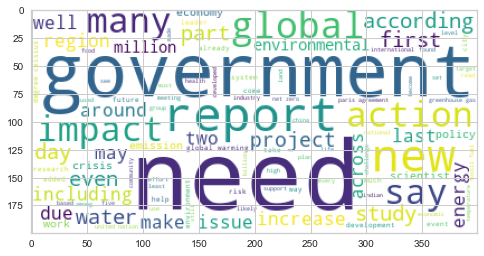

In [188]:
cluster_labels = clusterer.fit_predict(distance_array)
f["labels"] = cluster_labels
for i in sorted(list(set(cluster_labels))):
    
    if i== -1 :
        continue
    if i == 1:
        break
    print("="*50)
    print("Cluster ",i+1," talks about :")
    print()
    str_words = ' '.join(df[df["labels"]==i]["text"].values.tolist())
    wc = WordCloud(stopwords=stopwords,background_color = 'white',max_words = 100)
    wc.generate(str_words)
    plt.imshow(wc)
    plt.show()

## LDA

In [198]:
#Code to find the best
from sklearn.decomposition import LatentDirichletAllocation as LDA

from sklearn.model_selection import GridSearchCV

search_params = {'n_components': [10, 15, 20, 25, 30], 'learning_decay': [.5, .7, .9]}

lda = LDA(learning_method='online', learning_offset=50.,random_state=100)
lda1 = LDA(learning_method='online', learning_offset=50.,random_state=100)
model = GridSearchCV(lda, param_grid=search_params)
model1 = GridSearchCV(lda1, param_grid=search_params)

model.fit(tf_idf_vectors.toarray())
model1.fit(tf_idf1.toarray())

best_lda_model = model.best_estimator_
best_lda_model1 = model1.best_estimator_

print("Best Model's Params: ", model.best_params_)

print("Best Log Likelihood Score: ", model.best_score_)


print("Model Perplexity: ", best_lda_model.perplexity(tf_idf_vectors.toarray()))


print("Best second Model's Params: ", model1.best_params_)

print("Best Log Likelihood Score: ", model1.best_score_)


print("Model Perplexity: ", best_lda_model1.perplexity(tf_idf1.toarray()))

Best Model's Params:  {'learning_decay': 0.5, 'n_components': 10}
Best Log Likelihood Score:  -8266.302375695383
Model Perplexity:  2489.6936530990715
Best second Model's Params:  {'learning_decay': 0.5, 'n_components': 10}
Best Log Likelihood Score:  -14188.230247737394
Model Perplexity:  1852.093323120198


In [ ]:
##BELOW CODE IS FOR INDIAN NEWS

In [329]:
lda_output = best_lda_model.transform(tf_idf_vectors)


topicnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]

docnames = ["Doc" + str(i) for i in range(len(df.text))]

df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)


dominant_topic = np.argmax(df_document_topic.values, axis=1)

df_document_topic["dominant_topic"] = dominant_topic


def color_green(val):
    color = "green" if val > .1 else "black"
    return "color: {col}".format(col=color)
def make_bold(val):
    weight = 700 if val > .1 else 400
    return "font-weight: {weight}".format(weight=weight)

df_document_topics = df_document_topic.head(5).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,dominant_topic
Doc0,0.010000,0.010000,0.010000,0.920000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,3
Doc1,0.010000,0.010000,0.010000,0.920000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,3
Doc2,0.020000,0.020000,0.020000,0.830000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,3
Doc3,0.020000,0.020000,0.020000,0.860000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,3
Doc4,0.010000,0.010000,0.010000,0.930000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,3


In [ ]:
#BELOW CODE IS FOR AMERICAN NEWS

In [337]:
lda_output1 = best_lda_model1.transform(tf_idf1)

topicnames = ["Topic" + str(i) for i in range(best_lda_model1.n_components)]

docnames = ["Doc" + str(i) for i in range(len(f.text))]

df_document_topic = pd.DataFrame(np.round(lda_output1, 2), columns=topicnames, index=docnames)


dominant_topic = np.argmax(df_document_topic.values, axis=1)

df_document_topic["dominant_topic"] = dominant_topic


def color_green(val):
    color = "green" if val > .1 else "black"
    return "color: {col}".format(col=color)
def make_bold(val):
    weight = 700 if val > .1 else 400
    return "font-weight: {weight}".format(weight=weight)

df_document_topics1 = df_document_topic.head(5).style.applymap(color_green).applymap(make_bold)
df_document_topics1

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,dominant_topic
Doc0,0.010000,0.010000,0.010000,0.010000,0.010000,0.910000,0.010000,0.010000,0.010000,0.010000,5
Doc1,0.010000,0.010000,0.010000,0.010000,0.010000,0.910000,0.010000,0.010000,0.010000,0.010000,5
Doc2,0.010000,0.010000,0.010000,0.010000,0.010000,0.940000,0.010000,0.010000,0.010000,0.010000,5
Doc3,0.010000,0.010000,0.010000,0.010000,0.010000,0.920000,0.010000,0.010000,0.010000,0.010000,5
Doc4,0.010000,0.010000,0.010000,0.010000,0.010000,0.910000,0.010000,0.010000,0.010000,0.010000,5


In [ ]:
#BELOW DATA IS FOR INDIAN NEWS

In [344]:
df_topic_keywords = pd.DataFrame(best_lda_model.components_)
df_topic_keywords.columns = vectorizer.get_feature_names()
df_topic_keywords.index = topicnames
df_topic_keywords.head()

/Users/adityagaikwad/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ability,able,access,accord,according,account,achieve,achieving,acre,across,...,worth,would,wrote,year,yet,york,young,youth,zero,zone
Topic0,0.101469,0.101869,0.102002,0.102169,0.101792,0.101903,0.101848,0.101888,0.101937,0.101813,...,0.102006,0.101955,0.101484,0.102542,0.101722,0.101719,0.102298,0.101575,0.102143,0.101829
Topic1,0.102215,0.102162,0.102642,0.103435,0.103111,0.101762,0.102067,0.102089,0.101854,0.103788,...,0.101884,0.103916,0.102490,0.106407,0.102819,0.102672,0.103153,0.102036,0.102276,0.102257
Topic2,0.101850,0.101998,0.101731,0.102076,0.102720,0.102038,0.102004,0.101822,0.102010,0.102312,...,0.101901,0.102870,0.102200,0.104776,0.101757,0.102771,0.101963,0.103072,0.102245,0.102296
Topic3,1.857077,2.787661,3.458145,4.652265,9.781367,3.352793,3.878060,2.107006,2.206027,7.769008,...,1.671719,14.483198,2.166072,21.765111,3.587525,2.080843,3.927019,2.503709,6.077847,4.700531
Topic4,0.101767,0.101956,0.102238,0.102338,0.102525,0.102140,0.102924,0.101997,0.102314,0.102229,...,0.101453,0.103583,0.102177,0.102892,0.102216,0.101950,0.102635,0.102966,0.102281,0.103204


In [ ]:
#BELOW DATA IS FOR AMERICAN NEWS

In [345]:
df_topic_keywords = pd.DataFrame(best_lda_model1.components_)
df_topic_keywords.columns = vectorizer1.get_feature_names()
df_topic_keywords.index = topicnames
df_topic_keywords.head()

/Users/adityagaikwad/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,able,access,according,account,achieve,across,act,action,activist,activity,...,world,worse,worst,would,year,yet,york,young,zero,zone
Topic0,0.100084,0.100116,0.100143,0.100113,0.100104,0.100133,0.100095,0.100145,0.100103,0.100094,...,0.100136,0.100091,0.100091,0.100136,0.100141,0.100097,0.100127,0.100108,0.100120,0.100097
Topic1,0.100111,0.100111,0.100192,0.100107,0.100091,0.100094,0.100113,0.100141,0.100135,0.100132,...,0.100231,0.100104,0.100122,0.100205,0.100269,0.100122,0.100088,0.100092,0.100149,0.100099
Topic2,0.100107,0.100094,0.100124,0.100096,0.100101,0.100127,0.100095,0.100118,0.100099,0.100085,...,0.100135,0.100103,0.100095,0.100137,0.100146,0.100123,0.100094,0.100104,0.100131,0.100105
Topic3,0.100143,0.100131,0.100208,0.100082,0.100107,0.100141,0.100173,0.100198,0.100124,0.100124,...,0.100203,0.100112,0.100106,0.100379,0.100305,0.100124,0.100133,0.100133,0.100125,0.100138
Topic4,0.100101,0.100096,0.100130,0.100143,0.100104,0.100145,0.100134,0.100132,0.100096,0.100096,...,0.100157,0.100121,0.100116,0.100141,0.100136,0.100109,0.100094,0.100128,0.100097,0.100110


* Below we are showing top 15 keywords for each topic for Indian news

In [353]:
def show_topics(vectorizer=tf_idf_vectors,lda_model=best_lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords
topic_keywords = show_topics(vectorizer=count, lda_model=best_lda_model, n_words=15)

df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Important Word '+str(i+1) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i+1) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

/Users/adityagaikwad/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Important Word 1,Important Word 2,Important Word 3,Important Word 4,Important Word 5,Important Word 6,Important Word 7,Important Word 8,Important Word 9,Important Word 10,Important Word 11,Important Word 12,Important Word 13,Important Word 14,Important Word 15
Topic 1,thunberg,school,activist,art,europe,target,strike,compared,student,protest,concentration,week,group,britain,category
Topic 2,trump,biden,world,president,cop,conference,thunberg,water,year,debate,country,pandemic,china,covid,crisis
Topic 3,thunberg,greta,protest,country,action,strike,fire,year,school,read,also,people,world,emission,developed
Topic 4,world,year,country,report,global,emission,people,one,also,state,forest,temperature,study,would,area
Topic 5,forest,project,eia,notification,state,environment,ministry,draft,government,department,minister,area,target,environmental,land
Topic 6,sea,ice,specie,year,island,snow,level,record,emission,region,tiger,commission,antarctica,also,fish
Topic 7,country,economic,emission,book,report,environment,disease,government,landslide,zero,new,need,time,temperature,global
Topic 8,ice,amazon,region,sea,antarctica,imf,project,study,level,deforestation,warming,square,implementation,energy,year
Topic 9,forest,crore,oil,farmer,bird,also,wetland,state,district,coral,threat,year,virus,production,development
Topic 10,biden,mumbai,trump,california,president,rain,state,day,recorded,weather,fire,wildfire,temperature,presidential,accord


*Below code is for the top 15 keywords for American news

In [358]:
def show_topics(vectorizer=tf_idf1,lda_model=best_lda_model, n_words=20):
    keywords = np.array(vectorizer1.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords
topic_keywords = show_topics(vectorizer=count, lda_model=best_lda_model1, n_words=15)

df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Important Word '+str(i+1) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i+1) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

/Users/adityagaikwad/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Important Word 1,Important Word 2,Important Word 3,Important Word 4,Important Word 5,Important Word 6,Important Word 7,Important Word 8,Important Word 9,Important Word 10,Important Word 11,Important Word 12,Important Word 13,Important Word 14,Important Word 15
Topic 1,drought,lake,que,water,los,conference,county,la,california,heat,council,china,space,wave,state
Topic 2,degree,country,carbon,emission,heat,global,gas,year,goal,water,methane,celsius,advertisement,percent,crop
Topic 3,fashion,que,fossil,fuel,emission,company,morning,warming,celsius,la,hurricane,degree,goal,nbc,risk
Topic 4,nuclear,would,state,advertisement,fire,new,program,biden,year,flood,federal,united,community,wildfire,power
Topic 5,report,nbc,fire,morning,heat,state,community,could,extreme,farmer,china,released,health,percent,get
Topic 6,emission,government,carbon,world,say,country,year,people,energy,would,new,cop,gas,coal,also
Topic 7,insulate,britain,protester,police,sus,protest,road,traffic,court,activist,highway,london,officer,group,people
Topic 8,vehicle,indigenous,system,amazon,federal,supplier,leather,america,land,cattle,crop,quality,state,water,power
Topic 9,ice,percent,heat,year,world,city,johnson,study,people,new,get,island,council,carbon,health
Topic 10,que,los,la,para,una,por,del,dijo,con,como,est,sus,advertisement,mayor,era


# VISUALISATION OF BOTH DATA'S POLARITY OF TEXT USING TEXTBLOB

In [365]:
li = df["text"].to_list()
#Tokenize to list of words for every sentence that has been cleaned for news title
from nltk import word_tokenize
from nltk.tokenize import word_tokenize
tokenized_sents_title = [word_tokenize(i) for i in li]
tokenized_sents_title

[['cop',
  'wrap',
  'young',
  'influencers',
  'across',
  'world',
  'sharing',
  'view',
  'social',
  'medium',
  'report',
  'galore',
  'impact',
  'never',
  'top',
  'mind',
  'many',
  'people',
  'increasingly',
  'seen',
  'really',
  'excitingly',
  'youth',
  'awareness',
  'participation',
  'every',
  'corner',
  'world',
  'traditional',
  'knowledge',
  'including',
  'nature',
  'passed',
  'within',
  'community',
  'generation',
  'today',
  'see',
  'clear',
  'strong',
  'correlation',
  'education',
  'awareness',
  'young',
  'people',
  'student',
  'future',
  'nation',
  'community',
  'education',
  'shape',
  'view',
  'sense',
  'accountability',
  'action',
  'responsible',
  'living',
  'formal',
  'education',
  'front',
  'active',
  'policy',
  'environment',
  'education',
  'since',
  'supreme',
  'court',
  'directive',
  'set',
  'possible',
  'way',
  'forward',
  'goal',
  'educate',
  'young',
  'indian',
  'environment',
  'learn',
  'sustain

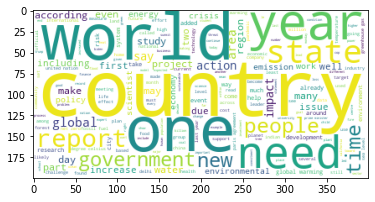

In [366]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
str_words = ' '.join(li)
wc = WordCloud(background_color = 'white',max_words = 2000)
wc.generate(str_words)
plt.imshow(wc)

In [23]:
from textblob import TextBlob

sentiment_objects = [TextBlob(t) for t in df.text]
sentiment_values = [[t.sentiment.polarity, str(t)] for t in sentiment_objects]
sentiment_df = pd.DataFrame(sentiment_values, columns=["polarity", "text"])
sentiment_df.head()

,polarity,tweet
0,0.188068,"With COP26 a wrap, young influencers across t..."
1,0.053911,Despite recent headline-grabbing promises to ...
2,0.136364,Leaders at the Conference of the Parties (COP...
3,0.171429,British Prime Minister Boris Johnson praised ...
4,0.052806,The Glasgow Climate Pact is a message to inve...


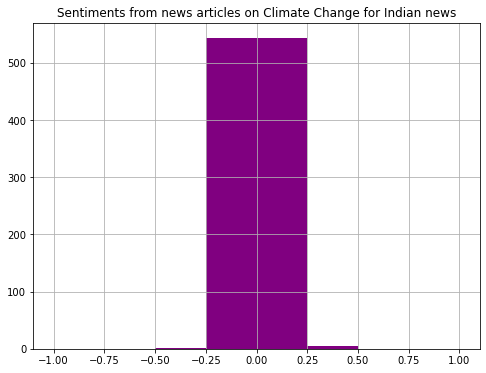

In [32]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram of the polarity values
sentiment_df.hist(bins=[-1, -0.75, -0.5, -0.25, 0.25, 0.5, 0.75, 1],
             ax=ax,
             color="purple")

plt.title("Sentiments from news articles on Climate Change for Indian news")
plt.show()

In [29]:
# Remove polarity values equal to zero
sentiment_df = sentiment_df[sentiment_df.polarity != 0]

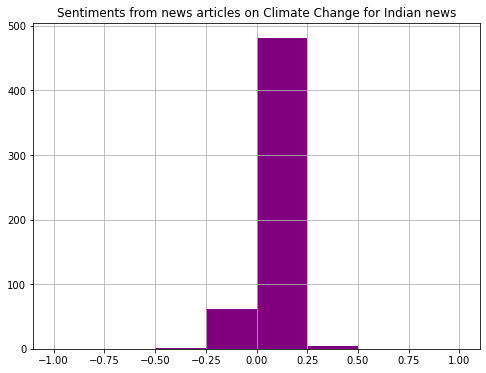

In [31]:
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram with break at zero
sentiment_df.hist(bins=[-1, -0.75, -0.5, -0.25, 0.0, 0.25, 0.5, 0.75, 1],
             ax=ax,
             color="purple")

plt.title("Sentiments from news articles on Climate Change for Indian news")
plt.show()

In [33]:
sentiment_objects = [TextBlob(t) for t in f.text]
sentiment_values = [[t.sentiment.polarity, str(t)] for t in sentiment_objects]
sentiment_df = pd.DataFrame(sentiment_values, columns=["polarity", "text"])
sentiment_df.head()

,polarity,text
0,0.083488,The world is set to add nearly 290 gigawatts ...
1,0.084340,"BANGOR, Maine (AP) — University of Maine rese..."
2,0.081855,"This article is part of “The Fifth Crime,” a ..."
3,0.037713,"LONDON — Days before arriving in Glasgow, Sco..."
4,0.058565,"In early November, Los Angeles City Council m..."


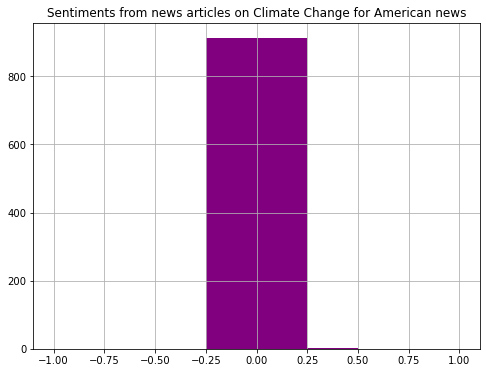

In [37]:
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram of the polarity values
sentiment_df.hist(bins=[-1, -0.75, -0.5, -0.25, 0.25, 0.5, 0.75, 1],
             ax=ax,
             color="purple")

plt.title("Sentiments from news articles on Climate Change for American news")
plt.show()

In [38]:
# Remove polarity values equal to zero
sentiment_df = sentiment_df[sentiment_df.polarity != 0]

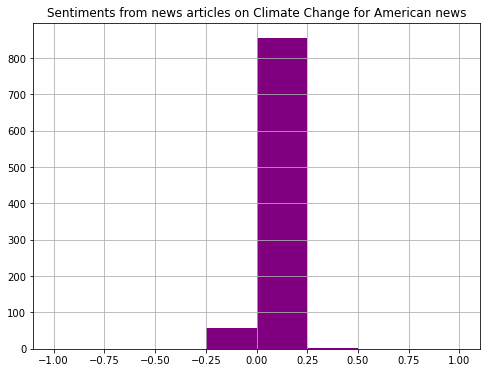

In [39]:
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram with break at zero
sentiment_df.hist(bins=[-1, -0.75, -0.5, -0.25, 0.0, 0.25, 0.5, 0.75, 1],
             ax=ax,
             color="purple")

plt.title("Sentiments from news articles on Climate Change for American news")
plt.show()

# CONCLUSION ANALYSIS